In [1]:
# Python 2 and 3 compatibility
# pip install future
from __future__ import (absolute_import, division,
                        print_function, unicode_literals)
# отключим предупреждения Anaconda
import warnings
warnings.simplefilter('ignore')

# будем отображать графики прямо в jupyter'e
%pylab inline
#графики в svg выглядят более четкими
%config InlineBackend.figure_format = 'svg' 

#увеличим дефолтный размер графиков
from pylab import rcParams
rcParams['figure.figsize'] = 6,3
import pandas as pd
import seaborn as sns

Populating the interactive namespace from numpy and matplotlib


Построить 5 графиков по выбранным данным. 

Графики должны быть различных видов и использовать хотя бы 3 из рассмотренных на занятии библиотек. 

Для каждого описать, какого типа переменные участвуют в визуализации, какова её цель (например, посмотреть на корреляцию двух величин или на распределение значений) и почему выбрали именно такой тип графика.

In [106]:
# Загрузим случайные 10 тыс. строк, т.к. все умирает на большом сете
df = pd.read_csv('train.csv').sample(frac=1).sample(n=20000)
print(df.shape)

(20000, 11)


## График 1
#### Посмотри мна распредление цлевой перменной- длительности поездок

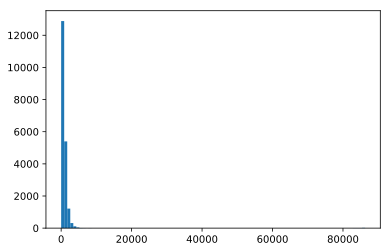

In [5]:
plt.hist(df.trip_duration,bins=100)
plt.show()

#### Видно, что распреддение сильно смещено- большинсво поездок очень коротки, однако присутвуют и очень длительные

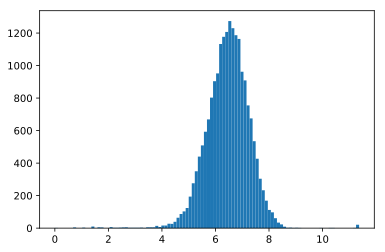

In [6]:

plt.hist(np.log(df.trip_duration),bins=100)
plt.show()

#### Простой переход к логарифму позволяте нам получить распредление похожее на нормальное, что очень существенно, например, для линейных моделей

## График 2

#### Какие -то инсайты нам может дать географическое рапредление мест посадок и окнчаний поездок  пассажиров

In [112]:
fig = plt.figure(figsize=(14,7))
ax1 = fig.add_subplot(121)
ax1.scatter(df.pickup_longitude,df.pickup_latitude,s=1,alpha=0.1)
plt.ylim([40.60,41.00])
plt.xlim([-74.15,-73.70])
plt.xlabel('Longitude',fontsize=16)
plt.ylabel('Latitude',fontsize=16)
plt.title('Pickup Location',fontsize=18)
ax2 = fig.add_subplot(122)
ax2.scatter(df.dropoff_longitude,df.dropoff_latitude,s=1,color='green',alpha=0.1)
plt.ylim([40.60,41.00])
plt.xlim([-74.15,-73.70])
plt.title('Dropoff Location',fontsize=18)
plt.xlabel('Longitude',fontsize=16)
plt.ylabel('Latitude',fontsize=16)

Text(0, 0.5, 'Latitude')

#### Из графика видно можно заметить что наибольшая плотность и посадок и окончаний поездок наблдается в Манхеттенне, а также в аропору. Вместе с тем окончания поездок в болшей степени  разбросаны по городу

## График 3
#### Прошлое наблдение кажется любопытным. Попотыаемся его проверить

In [107]:
#логирифмируем целевую переменную
df.trip_duration=np.log(df.trip_duration)

In [123]:
# Эта функция возаращет 1 для координаты аэропрта  или центра, 2- остальных кооринат( ну примерно)
def f(x,y):
          #  координта в   центре
    if  (x >40.70 and  y<-73.95)                    :
        return 1
        #  координта в аэропрту 
    elif (x <40.68 and  y>-73.85) and  (x >40.63 and  y<73.75):
         return 2
    else:
        return 3

In [124]:
# тут арифметический штука 1 будет если мы ездили внутри центра, 9- внутри окрестностей и.т.д
df['col_3'] = df.apply(lambda x: f(x.dropoff_latitude, x.dropoff_longitude), axis=1)*df.apply(lambda x: f(x.pickup_latitude, x.pickup_longitude), axis=1)

In [125]:
df['col_3'].value_counts()

1    15939
3     2798
9      671
2      378
6      177
4       37
Name: col_3, dtype: int64

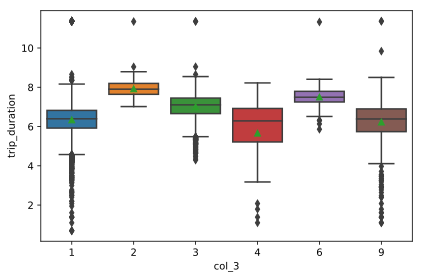

In [126]:
#boxplot очень удобно когда у нас небольшое значение вариации фичей

sns.boxplot(y='trip_duration', x='col_3', data=df, showmeans=True)
plt.tight_layout()
plt.show()

#### Из графика видно что наибольшая  проолжительность поездок наблдаласьу поездок между окраинами и центром, а также окраинами и аэропотом.
#### Также любопытное наблдение в том, например, что люди видимо катается внутри вэропорта, причем иного давольно существенное время
#### В целом , введение  подобных кластеров( или иных)  в модель может быть смогла бы повысить точность

## График 4
#### Посмотрим наблдается ли какая-то сезонность

In [192]:
# Вытащим драличные временные призаки
df['pickup_datetime_dt']=pd.to_datetime(df['pickup_datetime'])
df['pickup_year'] = df['pickup_datetime_dt'].dt.year
df['pickup_month'] = df['pickup_datetime_dt'].dt.month
df['pickup_week'] = df['pickup_datetime_dt'].dt.week
df['pickup_day'] = df['pickup_datetime_dt'].dt.day
df['pickup_date'] = df['pickup_datetime_dt'].dt.date
df['pickup_weekday'] = df['pickup_datetime_dt'].dt.weekday

In [170]:
df['pickup_month'].unique()

array([5, 4, 3, 1, 2, 6], dtype=int64)

In [158]:
sum_duration = df.groupby(['pickup_date','vendor_id'])[['trip_duration']].sum().reset_index()

In [160]:
from plotly.offline import init_notebook_mode, iplot
import plotly
import plotly.graph_objs as go

init_notebook_mode(connected=True)

In [168]:
trace0 = go.Scatter(
    x=sum_duration.pickup_date,
    y=sum_duration.trip_duration[sum_duration.vendor_id==1],
    name='vendor_id_2'
)

trace1 = go.Scatter(
    x=sum_duration.pickup_date,
    y=sum_duration.trip_duration[sum_duration.vendor_id==2],
    name='vendor_id_2'
)

data = [trace0, trace1]
layout = {'title': 'Суммарная продолжительность перевозок различными вендорами '}

fig = go.Figure(data=data, layout=layout)

iplot(fig, show_link=False)

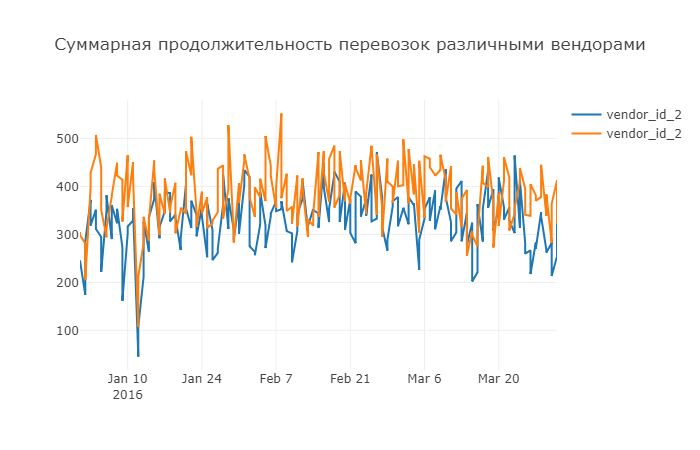

In [223]:
#github почему-то plotly не отображает, вставил карттркой, предыдущий график
from IPython.display import Image
Image('sum_duration.png')

#### Разница между вендорами набюлюдается только на отдельных учатсках времение( конец марта, начало января), в целом тренды схожие. Можно заметить колебания внутри недели

### Немедленно проверим это наблдение

In [199]:
trace0 = go.Bar(
    x=df.groupby(['pickup_weekday'])[['trip_duration']].sum().index,
    y=df.groupby(['pickup_weekday'])[['trip_duration']].sum().trip_duration,
    name='Global Sales',
    orientation = 'v'
)


data = [trace0]
layout = {'title': 'Суммарная длительность поездок по дням недели'}

fig = go.Figure(data=data, layout=layout)

iplot(fig, show_link=False)

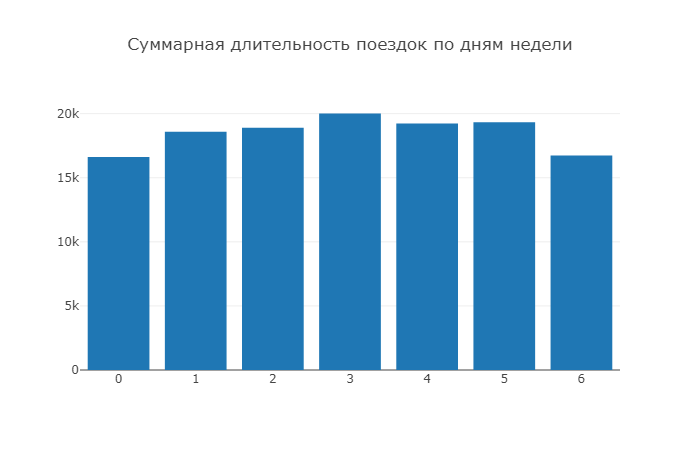

In [224]:
#github почему-то plotly не отображает, вставил карттркой, предыдущий график
from IPython.display import Image
Image('pickup_weekday_sum.png')

#### Дейсвительно, суммарная длительность поездок отличатся сущетвенно

In [200]:
trace0 = go.Bar(
    x=df.groupby(['pickup_weekday'])[['trip_duration']].mean().index,
    y=df.groupby(['pickup_weekday'])[['trip_duration']].mean().trip_duration,
    name='Global Sales',
    orientation = 'v'
)


data = [trace0]
layout = {'title': 'Средняя длительность поездок по дням недели'}

fig = go.Figure(data=data, layout=layout)

iplot(fig, show_link=False)

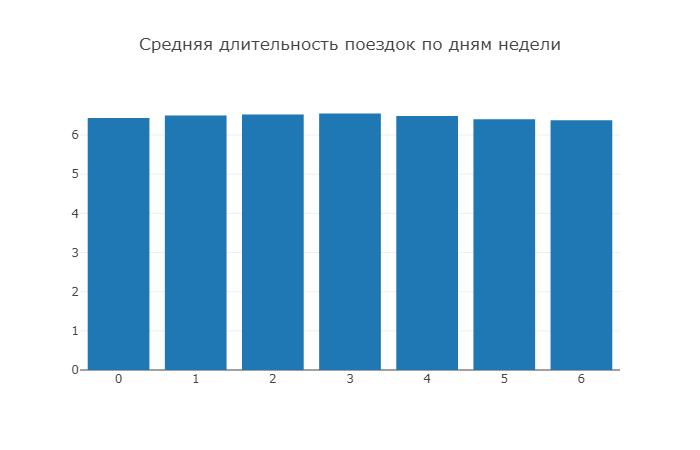

In [225]:
#github почему-то plotly не отображает, вставил карттркой, предыдущий график
from IPython.display import Image
Image('pickup_weekday_mean.png')

#### Однако средняя очень схожа- не думаю, что это будет сильным признаком

## График 5
#### Есть предположение, что длительность поездки может зависеть от расстояния, проверим его


In [209]:
## Т.к Земля не плоская необходимо использовать формулул гаверсинусов 
from math import radians, cos, sin, asin, sqrt
def haversine(lon1, lat1, lon2, lat2):
    """
    Calculate the great circle distance between two points 
    on the earth (specified in decimal degrees)
    """
    # convert decimal degrees to radians 
    lon1, lat1, lon2, lat2 = map(radians, [lon1, lat1, lon2, lat2])
    # haversine formula 
    dlon = lon2 - lon1 
    dlat = lat2 - lat1 
    a = sin(dlat/2)**2 + cos(lat1) * cos(lat2) * sin(dlon/2)**2
    c = 2 * asin(sqrt(a)) 
    # Radius of earth in kilometers is 6371
    km = 6371* c
    return km

In [218]:
df['havesine_distance']=df.apply(lambda x: haversine(x.pickup_longitude, x.pickup_latitude,x.dropoff_longitude,x.dropoff_latitude), axis=1)

In [220]:
sns.jointplot('havesine_distance','trip_duration',data=df,s=10,alpha=0.5,color='green')

### Данный график хорошо отражает заисимость между рассотянием и временем поездки. Видно что зависимость есть, однако оа не такая линейная